In [2]:
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import sys

sys.path.insert(1, str(Path().cwd().parent))
import common_config

In [3]:
common_config.figure_journal_basic()

In [4]:
sys.path.append('/Users/mamba/Documents') #TODO: replace with direct import
import Code.pertpy.pertpy as pt

In [5]:
#import pertpy as pt
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

In [6]:
adata = sc.read_h5ad("210310_GLPG_perturbations.h5ad")
adata

AnnData object with n_obs × n_vars = 431754 × 25194
    obs: 'identifier', 'time_point', 'n_counts', 'preprocessing_cluster', 'size_factors', 'S_score', 'G2M_score', 'phase', 'treatment_time', 'treatment', 'sample_name', 'condition', 'percent_mito', 'cluster_03', 'doublet_scores', 'n_genes', 'louvain_1', 'louvain_2', 'cell_type', 'cell_type_compact', 'batch_sample', 'batch_library', 'batch_sequencing', 'ashcroft_score'
    var: 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'n_counts', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'GLPG_annotation_colors', 'cell_type_colors', 'cluster_03_colors', 'condition_colors', 'hvg', 'identifier_colors', 'louvain', 'louvain_1_colors', 'neighbors', 'pca', 'time_point_colors', 'treatment_colors', 'treatment_time_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
adata.obs["treatment"].value_counts()

treatment
BLM+Combo         77660
BLM+GLPG1690      76515
BLM+Nintedanib    76385
Control           75636
BLM+GLPG1205      67985
BLM+PBS           57573
Name: count, dtype: int64

In [20]:
adata_blm = adata[adata.obs["treatment"].isin(["Control", "BLM+PBS"])]
adata_nintedanib = adata[adata.obs["treatment"].isin(["Control", "BLM+Nintedanib"])]
adata_glpg1205 = adata[adata.obs["treatment"].isin(["Control", "BLM+GLPG1205"])]
adata_glpg1690 = adata[adata.obs["treatment"].isin(["Control", "BLM+GLPG1690"])]
adata_combo = adata[adata.obs["treatment"].isin(["Control", "BLM+Combo"])]

In [8]:
adata_blm_combo = sc.read_h5ad("/Users/mamba/Downloads/adata_blm_combo_mcp.h5ad")
cell_type_group = adata_blm_combo.obs["cell_type_group"].values

In [9]:
np.all(adata.obs_names == adata_blm_combo.obs_names)

ValueError: Lengths must match to compare

In [10]:
adata

AnnData object with n_obs × n_vars = 431754 × 25194
    obs: 'identifier', 'time_point', 'n_counts', 'preprocessing_cluster', 'size_factors', 'S_score', 'G2M_score', 'phase', 'treatment_time', 'treatment', 'sample_name', 'condition', 'percent_mito', 'cluster_03', 'doublet_scores', 'n_genes', 'louvain_1', 'louvain_2', 'cell_type', 'cell_type_compact', 'batch_sample', 'batch_library', 'batch_sequencing', 'ashcroft_score'
    var: 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'n_counts', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'GLPG_annotation_colors', 'cell_type_colors', 'cluster_03_colors', 'condition_colors', 'hvg', 'identifier_colors', 'louvain', 'louvain_1_colors', 'neighbors', 'pca', 'time_point_colors', 'treatment_colors', 'treatment_time_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

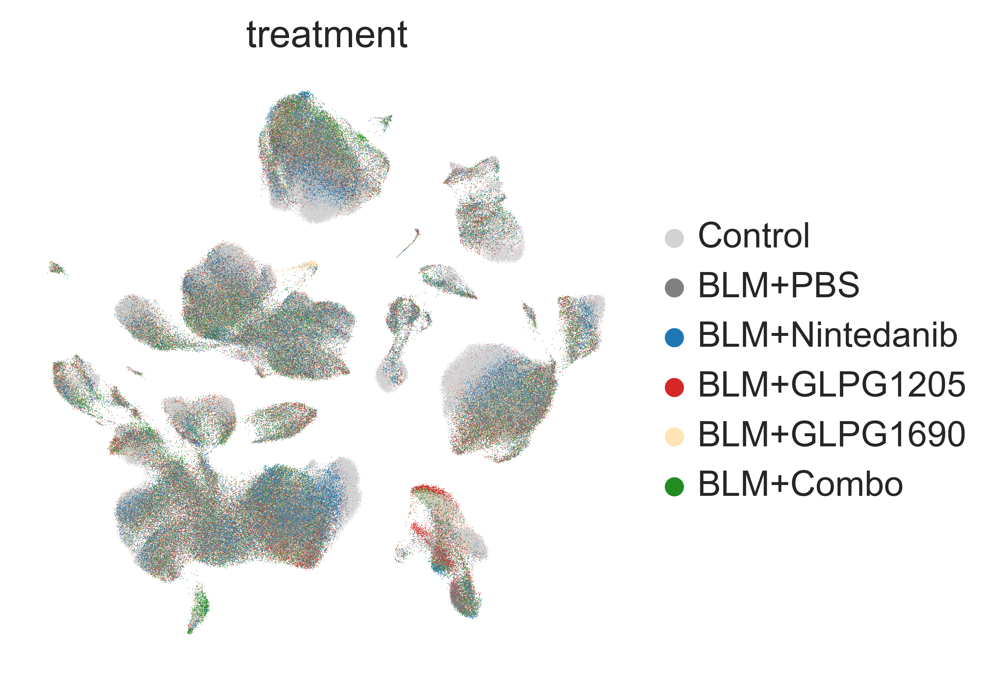

In [19]:
sc.pl.umap(adata_blm_combo, color="treatment", show=False)
plt.savefig("figures/treatment.png", bbox_inches="tight")

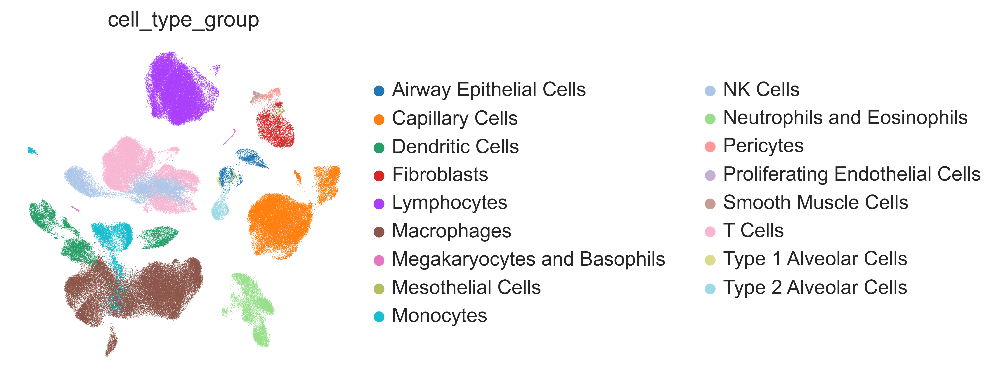

In [18]:
sc.pl.umap(adata_blm_combo, color="cell_type_group", show=False)
plt.savefig("figures/cell_type_group.png", bbox_inches="tight")

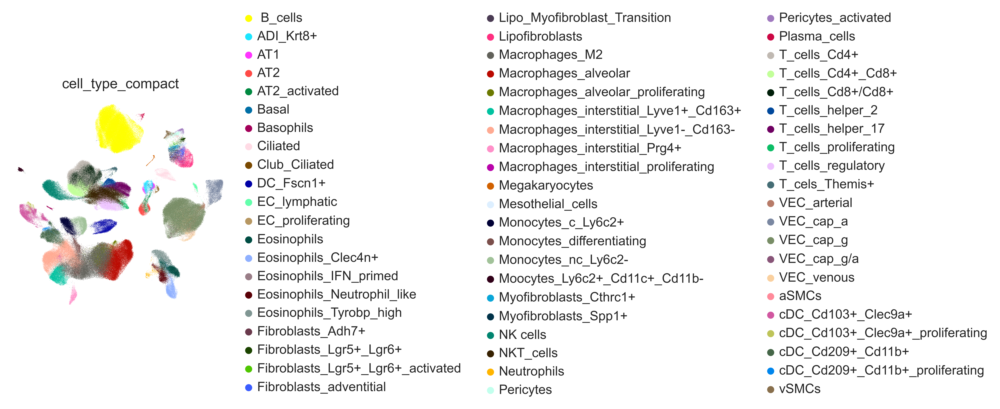

In [14]:
sc.pl.umap(adata_blm_combo, color="cell_type_compact")

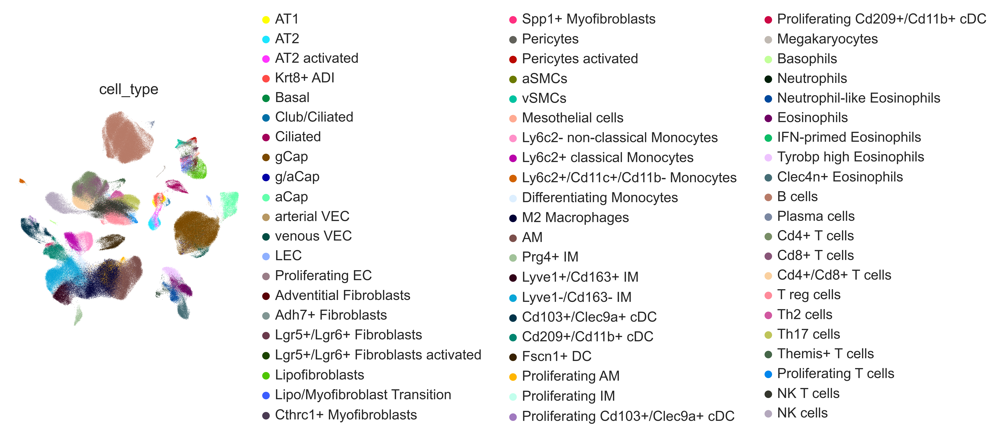

In [15]:
sc.pl.umap(adata_blm_combo, color="cell_type")

# Run scCODA

In [26]:
sccoda_model = pt.tl.Sccoda()

#cell_type_palette = {
 #   "Myofibroblasts": common_config.pt_red,
 #   "capillary EC": "lightblue",
 #   "ectopic EC": common_config.pt_orange,
 #   "Fibroblasts": common_config.pt_blue,
 #   "AT2": "green",
#}
    
def run_sccoda(subset, condition, plot=False):
    sccoda_data = sccoda_model.load(
        subset,
        type="cell_level",
        generate_sample_level=True,
        cell_type_identifier="cell_type",
        sample_identifier="sample_name",
        covariate_obs=["treatment"],
    )
    
    if plot:
        sccoda_model.plot_boxplots(
            sccoda_data,
            modality_key="coda",
            feature_name="treatment",
            add_dots=True,
        )
        fig = plt.gcf()
        fig.set_size_inches(30, 10)
        plt.savefig(f"figures/compositional_boxplot_{condition}_umap.png", bbox_inches="tight")

    sccoda_data = sccoda_model.prepare(
        sccoda_data,
        modality_key="coda",
        formula="treatment",
        reference_cell_type="automatic",
    )

    sccoda_model.run_nuts(sccoda_data, modality_key="coda")
        
    sccoda_model.set_fdr(sccoda_data, modality_key="coda", est_fdr=0.1)
    
    effect_df = sccoda_data["coda"].varm[f"effect_df_treatment[T.{condition.split('_vs')[0]}]"]
    
    sccoda_model.summary(sccoda_data, modality_key="coda")
    
    if plot:
        try:
            sccoda_model.plot_effects_barplot(
                sccoda_data, modality_key="coda", parameter="Final Parameter" #, palette=cell_type_palette
            )
            plt.savefig(f"figures/effects_barplot_{condition}_final_parameter.png", bbox_inches="tight")
            plt.close()
            
            sccoda_model.plot_effects_barplot(
                sccoda_data, modality_key="coda", parameter="log2-fold change", figsize=(effect_df[effect_df["log2-fold change"] != 0].shape[0], 5), plot_facets=False, #palette=cell_type_palette
            )
            plt.ylabel("log2-fold change")
            plt.savefig(f"figures/final_parameter_boxplot_{condition}_log2fc.pdf", bbox_inches="tight")
        except Exception:
            print(f"No effects found for {condition}")
    
    return sccoda_data

In [27]:
plot_df = pd.DataFrame({"log2-fold change": [], "Cell Type": [], "Treatment": [], "Final Parameter": []})

In [ ]:
sccoda_blm = run_sccoda(adata_blm, "BLM+PBS", plot=False) #TODO: Merge the following lines into the method above as far as possible
effect_df = sccoda_blm["coda"].varm["effect_df_treatment[T.BLM+PBS]"][["log2-fold change", "Final Parameter"]]
effect_df["Cell Type"] = effect_df.index
effect_df["Treatment"] = "BLM vs. Control"
plot_df = pd.concat([plot_df, effect_df])

In [ ]:
sccoda_nintedanib = run_sccoda(adata_nintedanib, "BLM+Nintedanib", plot=False)
effect_df = sccoda_nintedanib["coda"].varm["effect_df_treatment[T.FC+Nintedanib]"][["log2-fold change", "Final Parameter"]]
effect_df["Cell Type"] = effect_df.index
effect_df["Treatment"] = "BLM+Nintedanib vs. Control"
plot_df = pd.concat([plot_df, effect_df])

In [ ]:
sccoda_glpg1205 = run_sccoda(adata_glpg1205, "FC+GLPG1205", plot=False)
effect_df = sccoda_glpg1205["coda"].varm["effect_df_treatment[T.FC+CMP4]"][["log2-fold change", "Final Parameter"]]
effect_df["Cell Type"] = effect_df.index
effect_df["Treatment"] = "FC+CMP4 vs. CC"
plot_df = pd.concat([plot_df, effect_df])

In [ ]:
significant_cell_types = plot_df[plot_df["Final Parameter"] != 0]["Cell Type"].unique()
plot_df = plot_df[plot_df["Cell Type"].isin(significant_cell_types)]

palette={
        "FC vs. CC": common_config.pt_blue,
        "FC+CMP4 vs. CC": common_config.pt_orange,
        "FC+Nintedanib vs. CC": common_config.pt_red,
    }

plt.figure(figsize=(7, 4))
sns.barplot(data=plot_df, x="Cell Type", y="log2-fold change", hue="Treatment", palette=palette)
plt.xticks(rotation=45, ha="right")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.savefig("figures/scCODA_log2fc_significant_celltypes.pdf", bbox_inches="tight")